EXP 01
- Which sections are more likely to contain the dataset name?
- How many times is the dataset name repeated in a paper?
- Some labels have whitespace at the end
- Some labels may be written slightly differently in documents (may have 's' at the end, for example)
- Some labels are very long

In [23]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
import re
import seaborn as sns
from tqdm import tqdm

train_example_paths = glob.glob('data/train/*.json')
val_example_paths = glob.glob('data/test/*.json')

train_example_names = [fn.split('.')[0] for fn in os.listdir('data/train')]
test_example_names = [fn.split('.')[0] for fn in os.listdir('data/test')]

metadata = pd.read_csv('data/train.csv')
metadata_train = metadata.loc[metadata.Id.isin(train_example_names)]
metadata_test = metadata.loc[metadata.Id.isin(test_example_names)]

Observations:
- data keyword is important
- try removing texts in parantheses
- dataset name is usually repeated

In [2]:
def clean_text(txt):
    return re.sub('[^A-Za-z0-9]+', ' ', str(txt).lower())

def get_doc_id(doc_path):
    return os.path.split(train_example_names[0])[-1].split('.')[0]

def load_train_example(i: int):
    doc_path = train_example_paths[i]
    with open(doc_path) as f:
        data = json.load(f)
    return {'doc': data, 'meta': metadata.loc[metadata.Id == get_doc_id(doc_path)]}

def load_train_example_by_name(name):
    doc_path = os.path.join('data/train', name + '.json')
    with open(doc_path) as f:
        data = json.load(f)
    return data

## Labels and occurrences

In [44]:
pd.options.display.max_rows = 150
metadata.cleaned_label.value_counts()

adni                                                                                                                                3673
alzheimer s disease neuroimaging initiative adni                                                                                    2400
trends in international mathematics and science study                                                                               1163
baltimore longitudinal study of aging                                                                                               1156
early childhood longitudinal study                                                                                                  1011
education longitudinal study                                                                                                         676
census of agriculture                                                                                                                643
agricultural resource management survey  

In [33]:
max_sections = 2500
sec_count_columns = [f'sec_{i}_label_count' for i in range(max_sections)]
sec_count_rows = []

for i, r in tqdm(metadata_train.iterrows(), total = len(metadata_train)):
    last_label_col = 0
    new_row = np.zeros(max_sections + 2, dtype = 'int')
    label = r.cleaned_label
    doc = load_train_example_by_name(r.Id)
    assert(max_sections >=  len(doc))

    for j in range(len(doc)):
        label_count = clean_text(doc[j]['text']).count(label)
        new_row[j] = label_count
        if label_count > 0:
            last_label_col = j

    new_row[-2] = len(doc)
    new_row[-1] = last_label_col

    sec_count_rows.append(new_row)

metadata_sec_counts = pd.DataFrame(columns = sec_count_columns + ['n_sections', 'last_label_col'], data = sec_count_rows)

print(f'Label not found for {(metadata_sec_counts[sec_count_columns].sum(axis = 1) == 0).sum()} docs')

100%|██████████| 19661/19661 [02:05<00:00, 156.44it/s]
Label not found for 0 docs


## Section counts

Text(0.5, 1.0, 'A Closer Look')

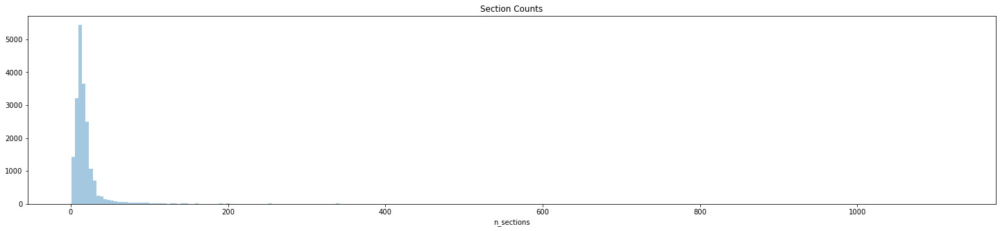

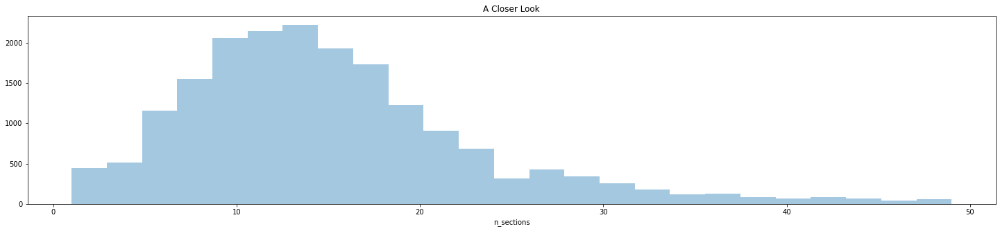

In [34]:
fig, ax = plt.subplots(figsize = (25, 5))
sns.distplot(metadata_sec_counts['n_sections'], kde = False, bins = 250, ax = ax)
ax.set_title('Section Counts')

fig, ax = plt.subplots(figsize = (25, 5))
sns.distplot(metadata_sec_counts.loc[metadata_sec_counts.n_sections < 50, 'n_sections'], kde = False, bins = 25, ax = ax)
ax.set_title('A Closer Look')

## Section Counts vs. Index Of Section With the Last Label
- Labels seem to be uniformly distributed among sections

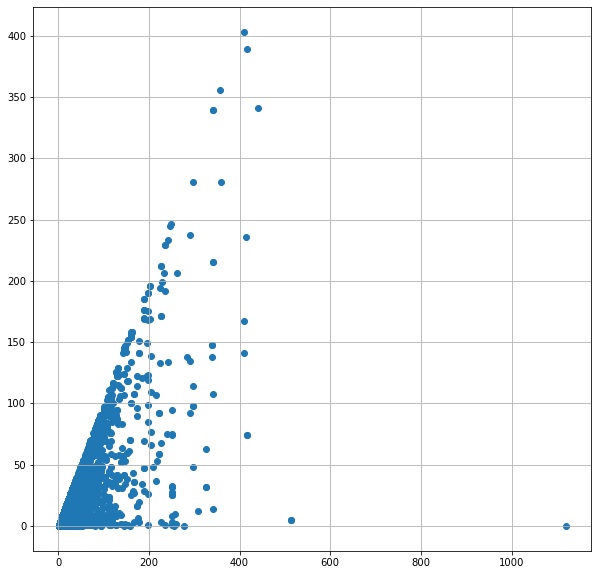

In [37]:
plt.figure(figsize = (10,10))
plt.scatter(x = metadata_sec_counts.n_sections, y = metadata_sec_counts.last_label_col)
plt.grid()

## Section Counts vs. Number of Occurrences

In [80]:
metadata_sec_counts['occurrences'] = metadata_sec_counts.values[:, :-2].sum(axis = 1)

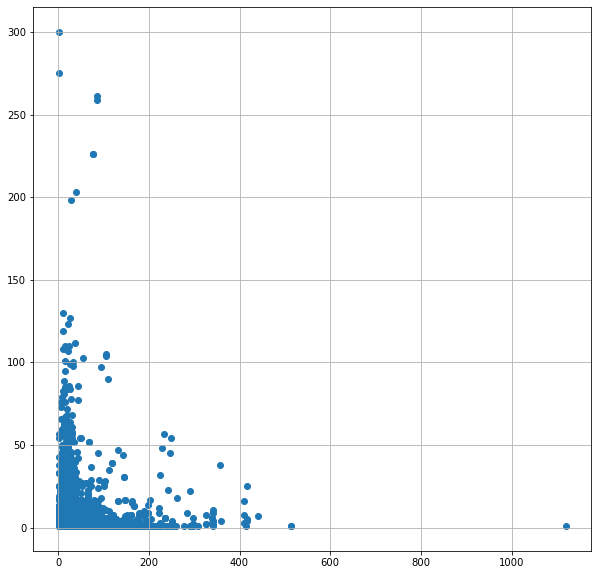

In [83]:
plt.figure(figsize = (10,10))
plt.scatter(x = metadata_sec_counts['n_sections'], y = metadata_sec_counts['occurrences'])
plt.grid()

In [107]:
from fuzzywuzzy import fuzz

In [116]:
# https://stackoverflow.com/questions/6294179/how-to-find-all-occurrences-of-an-element-in-a-list
def indices(lst, element):
    result = []
    for i, txt in enumerate(lst):
        if fuzz.ratio(txt, element) > 80:
            result.append(i)
    return result

cols = ['n_tokens', 'first_occurrence', 'last_occurrence', 'n_occurrence']
label_count_rows = []

for i, r in tqdm(metadata_train.iterrows(), total = len(metadata_train)):
    new_row = np.zeros(4, dtype = 'int')

    label = r.cleaned_label.strip()
    n_label_tokens = len(label.split(' '))

    doc = load_train_example_by_name(r.Id)
    doc_text = ' '.join([clean_text(sec['text']) for sec in doc])

    doc_tokens = doc_text.split(' ')
    doc_tokens = [' '.join(doc_tokens[i:i+n_label_tokens]) for i in range(len(doc_tokens) - n_label_tokens + 1)]
    occurrences = indices(doc_tokens, label)
    assert(len(occurrences) != 0)

    new_row[0] = len(doc_tokens) + n_label_tokens - 1
    new_row[1] = occurrences[0]
    new_row[2] = occurrences[-1]
    new_row[3] = len(occurrences)

    label_count_rows.append(new_row)

metadata_token_counts = pd.DataFrame(columns = cols, data = label_count_rows)

print(f'Label not found for {(metadata_token_counts["n_occurrence"] == 0).sum()} docs')

100%|██████████| 19661/19661 [21:27<00:00, 15.27it/s]
Label not found for 0 docs


In [119]:
metadata_token_counts.n_occurrence.min()

1

In [120]:
metadata_token_counts.n_occurrence.max()

854

In [117]:
metadata_token_counts

,n_tokens,first_occurrence,last_occurrence,n_occurrence
0,1816,5,878,6
1,1773,68,486,5
2,5657,174,3701,9
3,1013,529,705,4
4,4868,14,3863,8
...,...,...,...,...
19656,4786,443,445,3
19657,4356,973,3362,12
19658,4200,1083,3661,11
19659,7397,798,4120,7


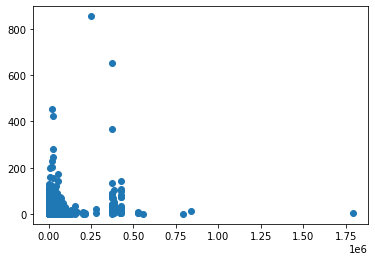

In [118]:
plt.scatter(x = metadata_token_counts.n_tokens, y = metadata_token_counts.n_occurrence)

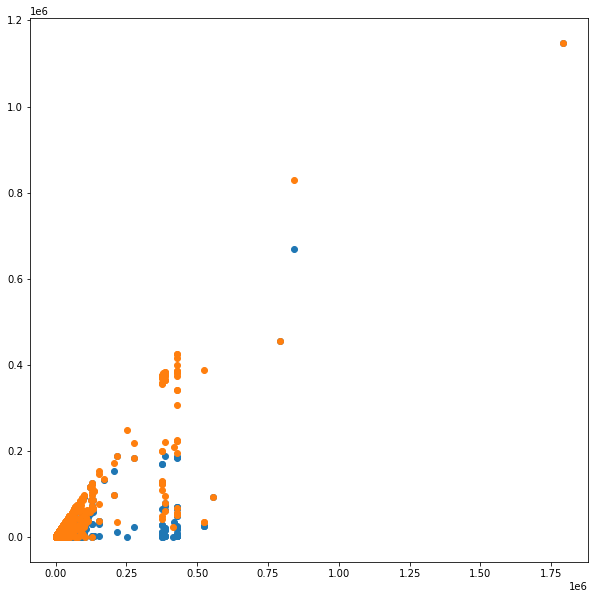

In [124]:
plt.figure(figsize=(10,10))
plt.scatter(x = metadata_token_counts.n_tokens, y = metadata_token_counts.first_occurrence)
plt.scatter(x = metadata_token_counts.n_tokens, y = metadata_token_counts.last_occurrence)

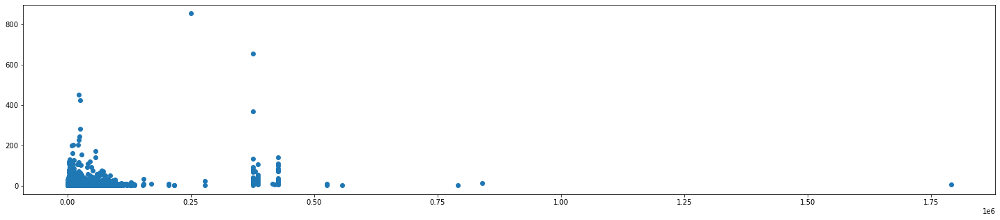

In [126]:
plt.figure(figsize=(25,5))
plt.scatter(x = metadata_token_counts.n_tokens, y = metadata_token_counts.n_occurrence)

In [130]:
metadata_train['n_occurrence'] = metadata_token_counts.n_occurrence

In [136]:
label_stats = pd.DataFrame()
label_stats['median_occurrence'] = metadata_train.groupby('cleaned_label')['n_occurrence'].apply(lambda x: x.median())
label_stats['std_occurrence'] = metadata_train.groupby('cleaned_label')['n_occurrence'].apply(lambda x: x.std())
label_stats['min_occurrence'] = metadata_train.groupby('cleaned_label')['n_occurrence'].apply(lambda x: x.min())
label_stats['max_occurrence'] = metadata_train.groupby('cleaned_label')['n_occurrence'].apply(lambda x: x.max())

In [139]:
label_stats.sort_values(by = 'max_occurrence', ascending = False)

,median_occurrence,std_occurrence,min_occurrence,max_occurrence
cleaned_label,,,,
trends in international mathematics and science study,4.0,26.021338,3,854
national education longitudinal study,4.0,29.423269,1,654
beginning postsecondary student,8.5,77.278289,1,453
education longitudinal study,2.0,15.025250,1,368
beginning postsecondary students,5.0,31.536806,1,281
adni,5.0,14.345448,1,202
survey of doctorate recipients,3.0,15.707485,1,141
school survey on crime and safety,4.5,24.235226,1,120
high school longitudinal study,3.0,13.228179,1,111


## Generate labels

In [142]:
def indices(lst, element):
    result = []
    for i, txt in enumerate(lst):
        if fuzz.ratio(txt, element) > 80:
            result.append(i)
    return result

cols = ['n_tokens', 'first_occurrence', 'last_occurrence', 'n_occurrence']
doc_label_idx = []

for i, r in tqdm(metadata_train.iterrows(), total = len(metadata_train)):
    this_doc_label_idx = []

    label = r.cleaned_label.strip()
    n_label_tokens = len(label.split(' '))

    doc = load_train_example_by_name(r.Id)
    doc_text = ' '.join([clean_text(sec['text']) for sec in doc])

    doc_tokens = doc_text.split(' ')
    doc_tokens = [' '.join(doc_tokens[i:i+n_label_tokens]) for i in range(len(doc_tokens) - n_label_tokens + 1)]

    occurrences = indices(doc_tokens, label)
    assert(len(occurrences) != 0)
    for o in occurrences:
        for i in range(n_label_tokens):
            this_doc_label_idx.append(o + i)

    assert(this_doc_label_idx[-1] < len(doc_tokens) + n_label_tokens - 1)

    doc_label_idx.append(this_doc_label_idx)

100%|██████████| 19661/19661 [27:21<00:00, 11.98it/s]
